In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

In [11]:
data= {
    "student": ["A", "B","C","D","E"],
    "math": [90,88,40,46,75],
    "science":[85,89,42,40,78]

}

df= pd.DataFrame(data)
print(df)

  student  math  science
0       A    90       85
1       B    88       89
2       C    40       42
3       D    46       40
4       E    75       78


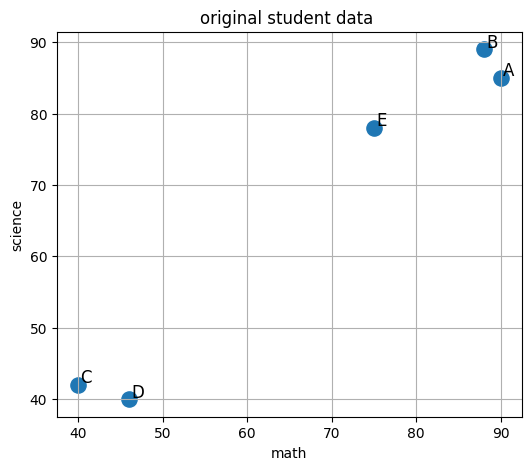

In [12]:
plt.figure(figsize=(6,5))

plt.scatter(df["math"], df["science"], s= 120)

for i in range(len(df)):
    plt.text(df["math"][i]+0.3,
             df["science"][i]+0.3,
             df["student"][i],
             fontsize= 12)


plt.xlabel("math")
plt.ylabel("science")
plt.title("original student data ")
plt.grid("True")

plt.show()


In [4]:
X = df[["math", "science"]]

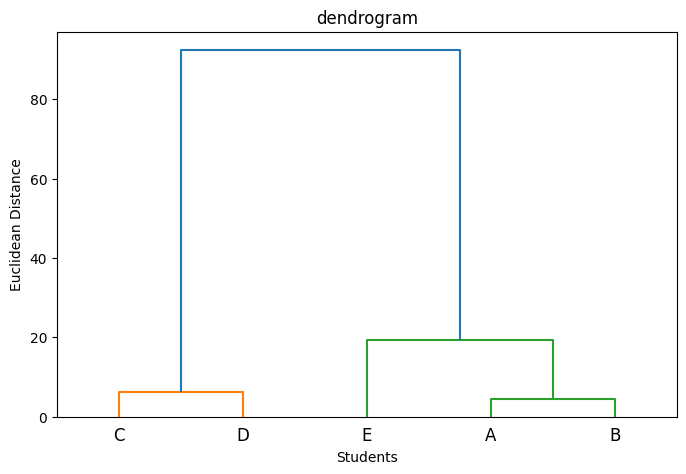

In [5]:
plt.figure(figsize=(8,5))

linkage_matrix= linkage(X, method= "ward")

dendrogram(linkage_matrix, 
           labels=df["student"].values)


plt.title("dendrogram")
plt.xlabel("Students")
plt.ylabel("Euclidean Distance")

plt.show()

In [6]:
# Apply Agglomerative clustering

model= AgglomerativeClustering(
    n_clusters=2,
    metric="euclidean",
    linkage="ward"
)

clusters= model.fit_predict(X)

df["cluster"]= clusters
print(df)

  student  math  science  cluster
0       A    90       85        0
1       B    88       89        0
2       C    40       42        1
3       D    46       40        1
4       E    75       78        0


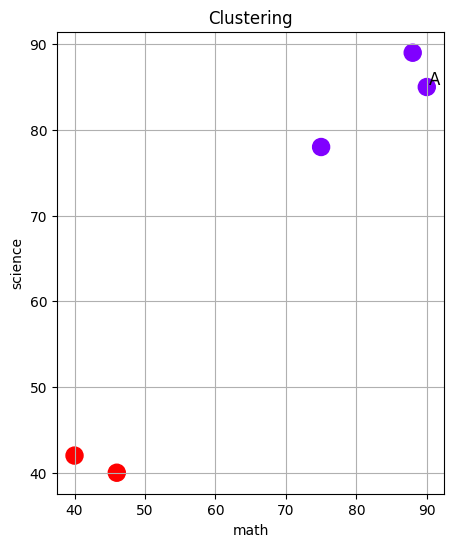

In [7]:
plt.figure(figsize=(5,6))

plt.scatter(df["math"],
            df["science"], 
            c= df["cluster"],
            cmap= "rainbow",
            s= 150)

for i in range(len(df)):
    plt.text(df["math"][i]+0.3,
                 df["science"][i]+0.3,
                 df["student"][i],
                 fontsize= 12)
    
    
    plt.xlabel("math")
    plt.ylabel("science")
    plt.title("Clustering")
    plt.grid("True")
    
    plt.show()
    

In [9]:
model= KMeans(n_clusters=2)

model.fit(X)

new_student= [[80, 82]]

print(model.predict(new_student))

[1]


c:\Users\sanch\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2827: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
